In [1]:
import random
import csv
from datetime import datetime, timedelta
import csv
import random
from datetime import datetime, timedelta
import os
import csv
from datetime import datetime
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime


In [2]:
quantidade_alunos = 500
quantidade_entradas=50000

SALAS_EXISTENTES = [
    "0S01", "0S02", 
    "AA3.26", "AA3.28", 
    "Auditório 1", "Auditório 4",
    "B2.01", "B2.02", 
    "C2.01", "C2.02",
    "D1.01", "D1.02"
]

In [3]:

def gerar_numeros_aluno(quantidade):
    """
    Gera uma lista de números de aluno com o formato '10xxxx'.
    """
    numeros_aluno = []
    while len(numeros_aluno) < quantidade:
        numero = f"10{random.randint(0000, 9999):04}"  # Gera os dígitos finais
        if numero not in numeros_aluno:
            numeros_aluno.append(numero)
    return numeros_aluno

def gerar_ips_unicos(quantidade):
    """
    Gera uma lista de IPs únicos no formato '192.168.X.Y', evitando repetições.
    """
    ips = set()
    while len(ips) < quantidade:
        x = random.randint(1, 254)  # Garante o intervalo permitido
        y = random.randint(1, 254)
        ip = f"192.168.{x}.{y}"
        ips.add(ip)
    return list(ips)

def gerar_dados_alunos(quantidade):
    """
    Gera uma lista de dicionários com números de aluno e IPs únicos.
    """
    numeros_aluno = gerar_numeros_aluno(quantidade)
    ips = gerar_ips_unicos(quantidade)
    dados = [{"numero_aluno": num, "ip": ip} for num, ip in zip(numeros_aluno, ips)]
    return dados

# Gera os dados para 250 alunos
dados_alunos = gerar_dados_alunos(quantidade_alunos)

# Exibe os primeiros 10 registros
for dado in dados_alunos[:5]:
    print(dado)


{'numero_aluno': '103517', 'ip': '192.168.167.97'}
{'numero_aluno': '104573', 'ip': '192.168.226.4'}
{'numero_aluno': '106092', 'ip': '192.168.236.232'}
{'numero_aluno': '107732', 'ip': '192.168.222.155'}
{'numero_aluno': '103137', 'ip': '192.168.113.55'}


In [4]:
def gerar_csv_presencas(nome_arquivo, dados_alunos, num_entradas):
    """
    Gera um CSV com registros de presença usando números de alunos e IPs fornecidos.
    """
    # Configurações de datas
    data_inicio = datetime(2024, 7, 2)  # 02/07/2024
    data_fim = datetime(2025, 7, 2)     # 02/07/2025
    ferias_inicio = datetime(2024, 12, 15)
    ferias_fim = datetime(2025, 2, 2)
    
    # Lista de horários possíveis
    horarios_possiveis = [
        (datetime.min + timedelta(hours=h, minutes=random.randint(0, 59))).time()
        for h in range(8, 21)  # Horas entre 08:00:00 e 21:00:00
    ]
    
    # Lista de registros
    registros = []

    # Itera até o número desejado de entradas
    while len(registros) < num_entradas:
        # Gera uma data aleatória no intervalo
        delta_dias = random.randint(0, (data_fim - data_inicio).days)
        data = data_inicio + timedelta(days=delta_dias)
        
        # Ignora sábados, domingos e período de férias
        if data.weekday() >= 5 or (ferias_inicio <= data <= ferias_fim):
            continue
        
        # Escolhe horário, sala, número de aluno e IP
        horario = random.choice(horarios_possiveis)
        sala = random.choice(SALAS_EXISTENTES)
        aluno = random.choice(dados_alunos)
        numero_aluno = aluno['numero_aluno']
        ip = aluno['ip']
        
        # Adiciona registro
        registros.append([numero_aluno, sala, data.strftime('%d/%m/%Y'), horario.strftime('%H:%M:%S'), ip])
    
    # Cria diretório caso não exista
    caminho_diretorio = r"C:\Users\vitor\OneDrive\Desktop\ADS\testes"
    os.makedirs(caminho_diretorio, exist_ok=True)
    
    # Caminho completo do arquivo
    caminho_arquivo = os.path.join(caminho_diretorio, f"{nome_arquivo}.csv")
    
    # Salva os dados no CSV
    with open(caminho_arquivo, mode='w', newline='', encoding='utf-8') as file:
        writer = csv.writer(file)
        writer.writerow(["Número do Aluno", "Sala", "Data", "Hora", "IP"])
        writer.writerows(registros)

    print(f"CSV '{caminho_arquivo}' gerado com sucesso com {num_entradas} entradas.")

# Função para gerar números de aluno e IPs únicos
def gerar_dados_alunos(quantidade):
    numeros_aluno = [f"10{random.randint(0, 9999):04}" for _ in range(quantidade)]
    ips = [f"192.168.{random.randint(1, 254)}.{random.randint(1, 254)}" for _ in range(quantidade)]
    return [{"numero_aluno": n, "ip": i} for n, i in zip(numeros_aluno, ips)]

dados_alunos = gerar_dados_alunos(quantidade_alunos)

gerar_csv_presencas("csvExemplo", dados_alunos, quantidade_entradas)


CSV 'C:\Users\vitor\OneDrive\Desktop\ADS\testes\csvExemplo.csv' gerado com sucesso com 50000 entradas.


In [5]:

debug= True
# Caminho do arquivo CSV
caminho_arquivo = r"C:\Users\vitor\OneDrive\Desktop\ADS\lista_presencas.csv"
caminho_arquivo_validas = r"C:\Users\vitor\OneDrive\Desktop\ADS\entradas_validas.csv"

if debug:
  caminho_arquivo = r"C:\Users\vitor\OneDrive\Desktop\ADS\testes\csvExemplo.csv"
  caminho_arquivo_validas = r"C:\Users\vitor\OneDrive\Desktop\ADS\testes\entradas_validas_Exemplo.csv"

# Lista de intervalos de horários
intervalos = [
    ("09:00:00", "10:00:00"), ("10:00:00", "11:00:00"), ("11:00:00", "12:00:00"),
    ("12:00:00", "13:00:00"), ("13:00:00", "14:00:00"), ("14:00:00", "15:00:00"),
    ("15:00:00", "16:00:00"), ("16:00:00", "17:00:00"), ("17:00:00", "18:00:00"),
    ("18:00:00", "19:00:00"), ("19:00:00", "20:00:00"), ("20:00:00", "21:00:00"),
    ("21:00:00", "22:00:00"), ("22:00:00", "23:00:00")
]


def ordenar_entradas(caminho_csv):
    """
    Ordena as entradas do CSV por IP, depois por dia e, por fim, por hora.

    :param caminho_csv: Caminho para o arquivo CSV contendo os dados.
    :return: Lista de dicionários ordenados por IP, dia e hora.
    """
    entradas = []

    # Ler o arquivo CSV
    with open(caminho_csv, newline='', encoding='utf-8') as csvfile:
        leitor = csv.reader(csvfile)
        headers = next(leitor)  # Captura os cabeçalhos
        for linha in leitor:
            data_hora = f"{linha[2].strip()} {linha[3].strip()}"  # Unificar data e hora
            entradas.append({
                "Número do Aluno": linha[0],
                "Sala": linha[1],
                "Data": linha[2].strip(),
                "Hora": linha[3].strip(),
                "Data e Hora": data_hora,
                "IP": linha[4].strip()
            })

    # Ordenar por IP, depois por data e depois por hora
    entradas_ordenadas = sorted(
        entradas,
        key=lambda x: (
            x["IP"],
            datetime.strptime(x["Data"], "%d/%m/%Y") if x["Data"] else datetime.min,
            datetime.strptime(x["Hora"], "%H:%M:%S") if x["Hora"] else datetime.min
        )
    )

    return entradas_ordenadas

def separar_entradas_por_intervalo(entradas):
    """
    Separa as entradas em válidas e inválidas com base em IP, dia e intervalo de horário.
    Apenas a primeira entrada de cada intervalo, por dia, por IP, é considerada válida.

    :param entradas: Lista de dicionários ordenados por IP, dia e hora.
    :return: Duas listas: entradas válidas e entradas inválidas.
    """
    entradas_validas = []
    entradas_invalidas = []

    # Obter intervalos únicos por IP e Dia
    entradas_por_ip = {}
    for entrada in entradas:
        ip = entrada["IP"]
        dia = entrada["Data"]
        if ip not in entradas_por_ip:
            entradas_por_ip[ip] = {}
        if dia not in entradas_por_ip[ip]:
            entradas_por_ip[ip][dia] = []
        entradas_por_ip[ip][dia].append(entrada)

    # Separar por intervalo
    for ip, dias in entradas_por_ip.items():
        for dia, entradas_dia in dias.items():
            intervalos_usados = set()  # Mantém controle dos intervalos já processados
            for entrada in entradas_dia:
                hora = datetime.strptime(entrada["Hora"], "%H:%M:%S").time()
                for inicio, fim in intervalos:
                    intervalo_inicio = datetime.strptime(inicio, "%H:%M:%S").time()
                    intervalo_fim = datetime.strptime(fim, "%H:%M:%S").time()

                    if intervalo_inicio <= hora <= intervalo_fim:
                        if (dia, inicio, fim) not in intervalos_usados:
                            entradas_validas.append(entrada)
                            intervalos_usados.add((dia, inicio, fim))
                        else:
                            entradas_invalidas.append(entrada)
                        break  # Intervalo encontrado, passar para a próxima entrada

    return entradas_validas, entradas_invalidas

def criar_csv_entradas_validas(caminho_csv_validas, entradas_validas):
    """
    Cria um arquivo CSV com base nas entradas válidas.

    :param caminho_csv_validas: Caminho para o novo arquivo CSV.
    :param entradas_validas: Lista de entradas válidas.
    """
    with open(caminho_csv_validas, mode='w', newline='', encoding='utf-8') as csvfile:
        escritor = csv.writer(csvfile)

        # Cabeçalhos do CSV original
        headers = ["Número do Aluno", "Sala", "Data e Hora", "IP"]
        escritor.writerow(headers)

        # Escrever as entradas válidas
        for entrada in entradas_validas:
            escritor.writerow([
                entrada["Número do Aluno"],
                entrada["Sala"],
                f"{entrada['Data']} {entrada['Hora']}",  # Concatenar Data e Hora
                entrada["IP"]
            ])


entradas_ordenadas = ordenar_entradas(caminho_arquivo)
criar_csv= True

entradas_validas, entradas_invalidas = separar_entradas_por_intervalo(entradas_ordenadas)

print("Entradas válidas:")
for entrada in entradas_validas:
        print(entrada)

print("\nEntradas inválidas:")
for entrada in entradas_invalidas:
        print(entrada)

if criar_csv:
    criar_csv_entradas_validas(caminho_arquivo_validas, entradas_validas)
    print(f"\nArquivo com entradas válidas criado em: {caminho_arquivo_validas}")



Entradas válidas:
{'Número do Aluno': '108014', 'Sala': 'AA3.26', 'Data': '03/07/2024', 'Hora': '17:50:00', 'Data e Hora': '03/07/2024 17:50:00', 'IP': '192.168.1.123'}
{'Número do Aluno': '108014', 'Sala': '0S02', 'Data': '04/07/2024', 'Hora': '10:33:00', 'Data e Hora': '04/07/2024 10:33:00', 'IP': '192.168.1.123'}
{'Número do Aluno': '108014', 'Sala': 'Auditório 4', 'Data': '15/07/2024', 'Hora': '18:34:00', 'Data e Hora': '15/07/2024 18:34:00', 'IP': '192.168.1.123'}
{'Número do Aluno': '108014', 'Sala': 'Auditório 1', 'Data': '19/07/2024', 'Hora': '19:50:00', 'Data e Hora': '19/07/2024 19:50:00', 'IP': '192.168.1.123'}
{'Número do Aluno': '108014', 'Sala': 'D1.01', 'Data': '23/07/2024', 'Hora': '13:57:00', 'Data e Hora': '23/07/2024 13:57:00', 'IP': '192.168.1.123'}
{'Número do Aluno': '108014', 'Sala': 'C2.02', 'Data': '23/07/2024', 'Hora': '20:57:00', 'Data e Hora': '23/07/2024 20:57:00', 'IP': '192.168.1.123'}
{'Número do Aluno': '108014', 'Sala': 'D1.02', 'Data': '24/07/2024', '

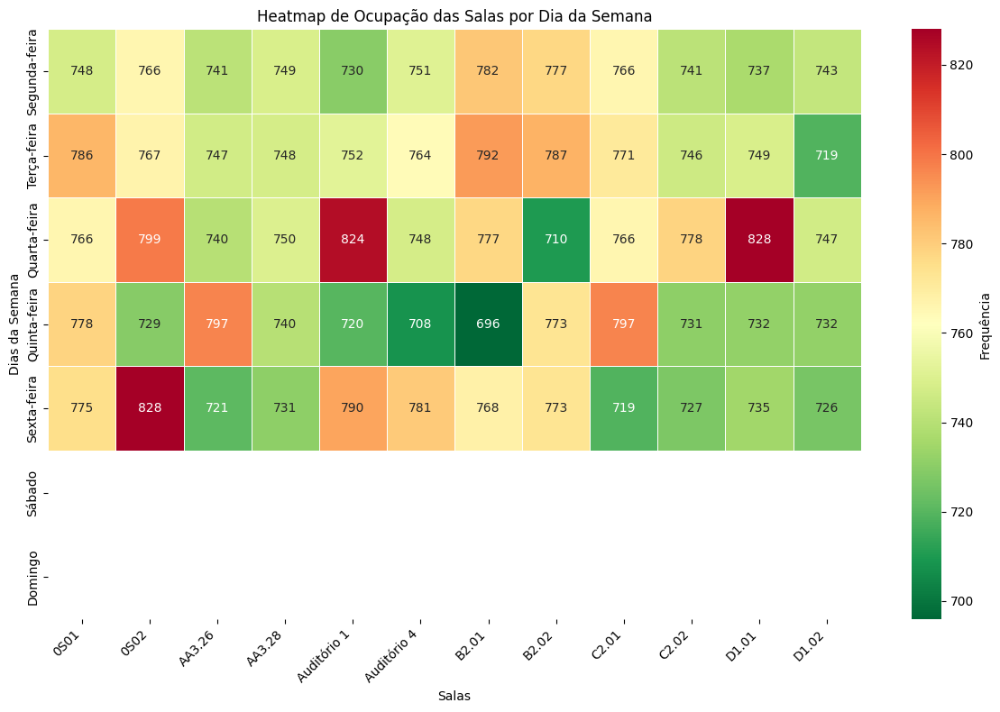

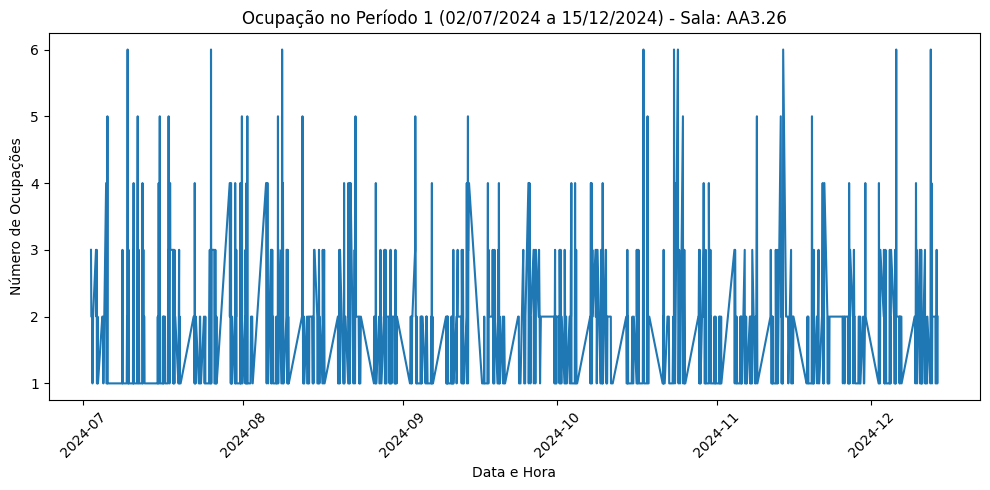

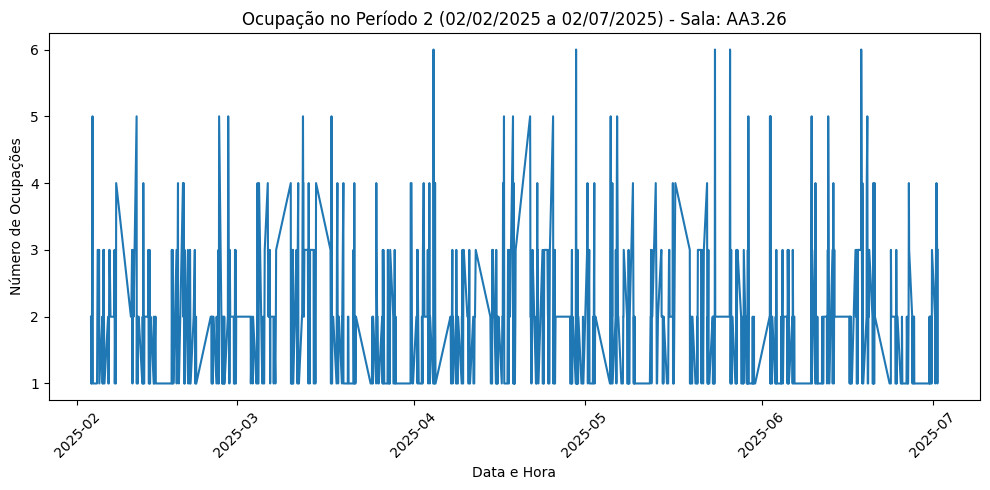

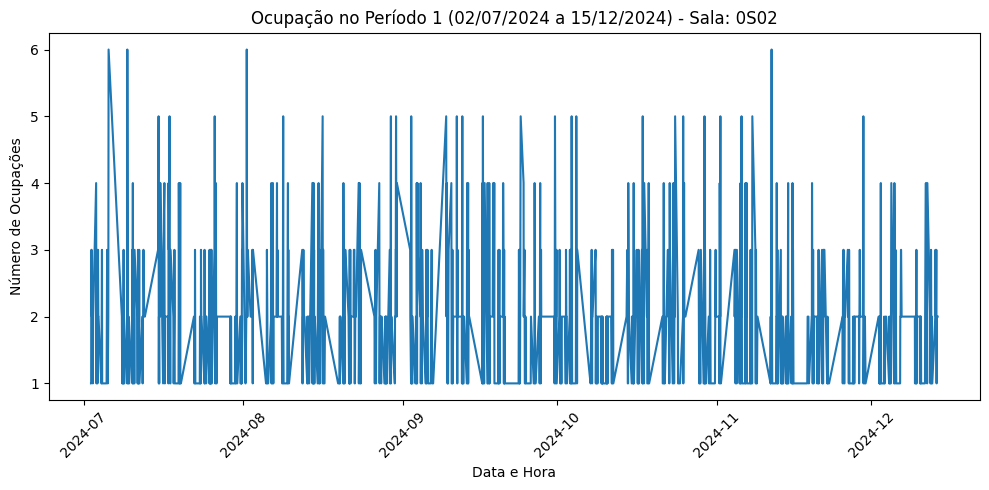

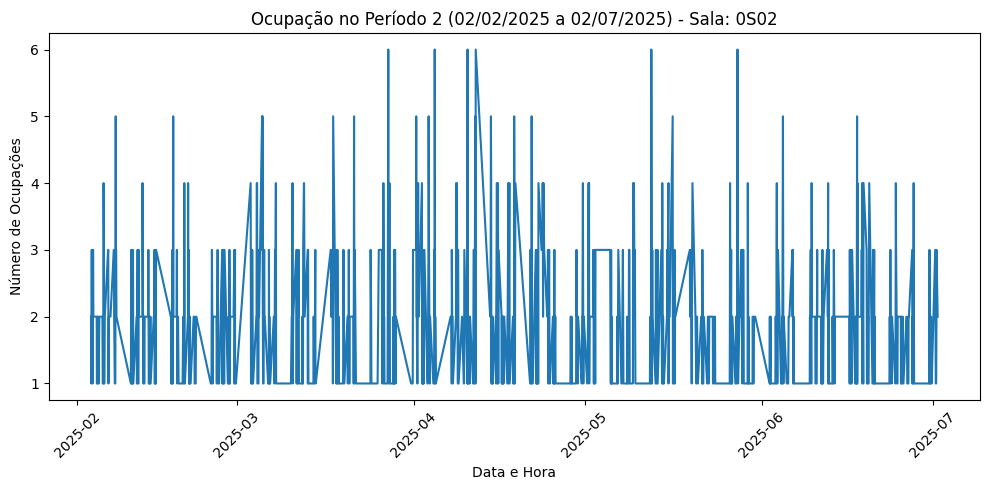

...

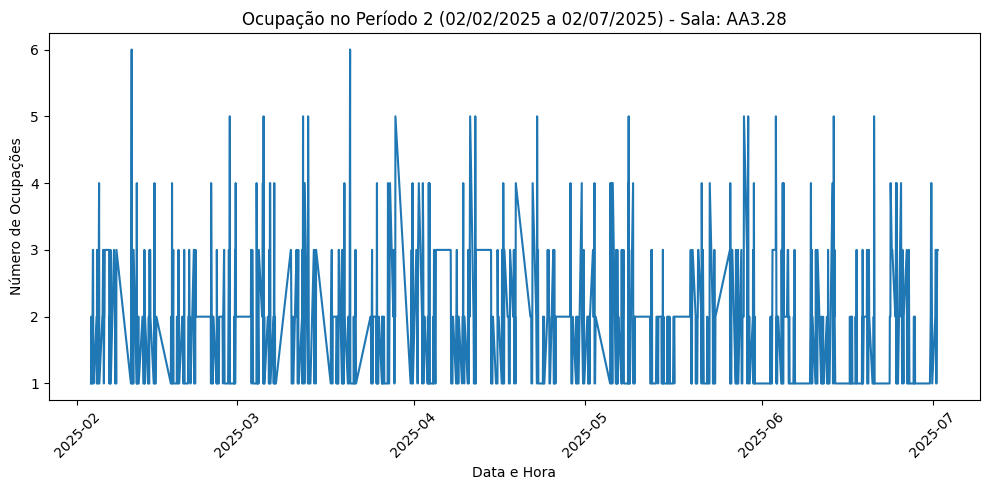

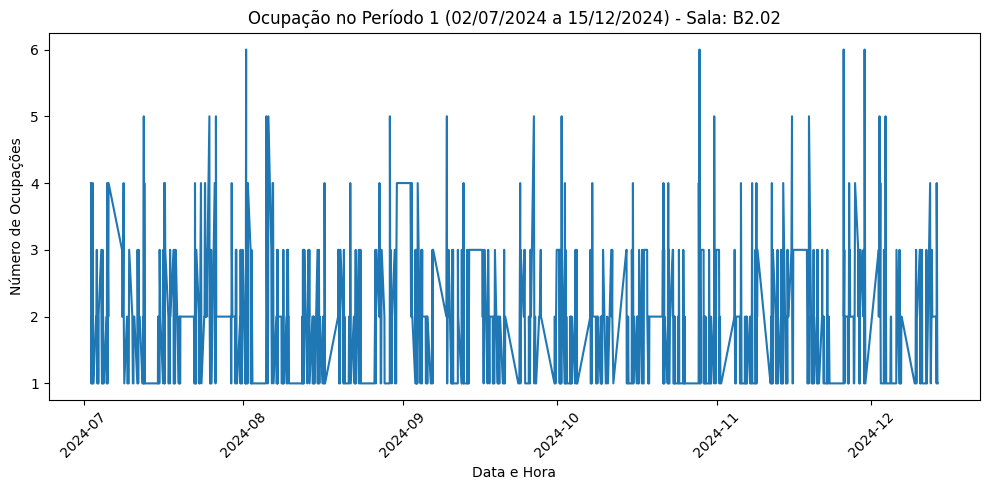

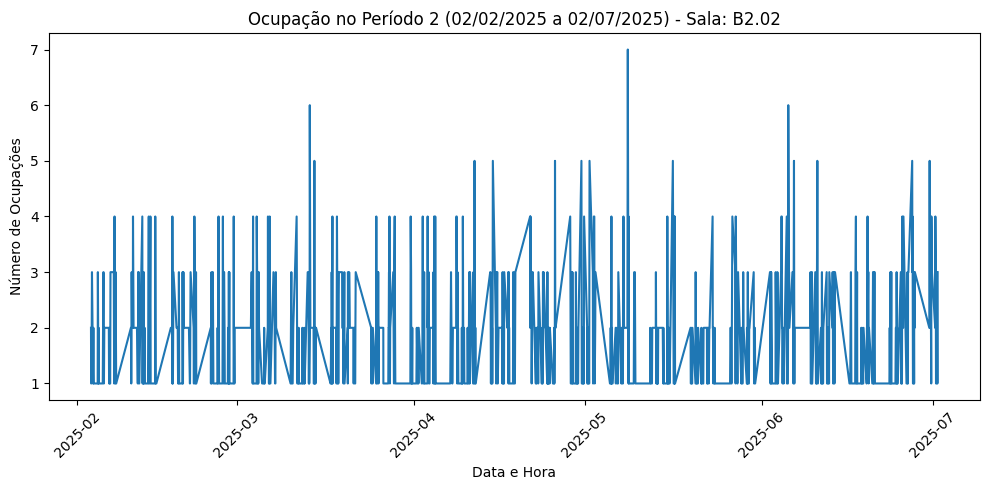

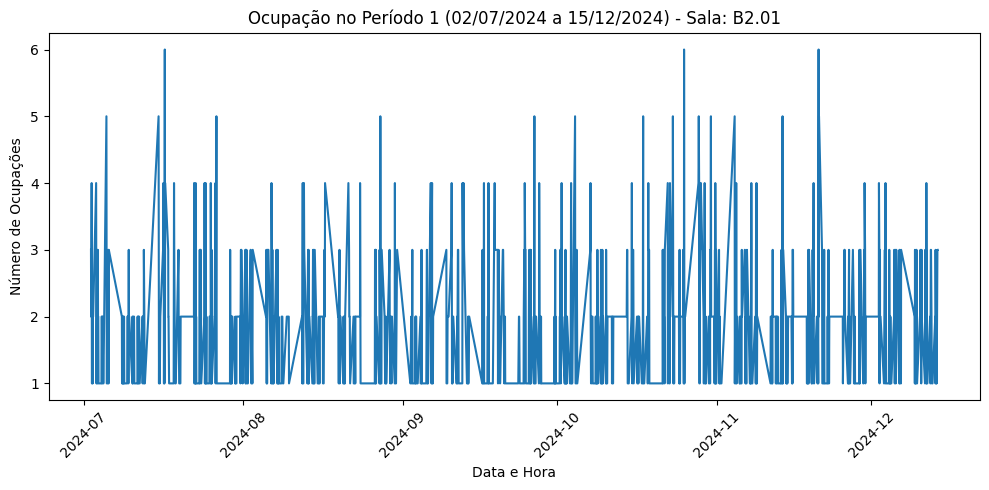

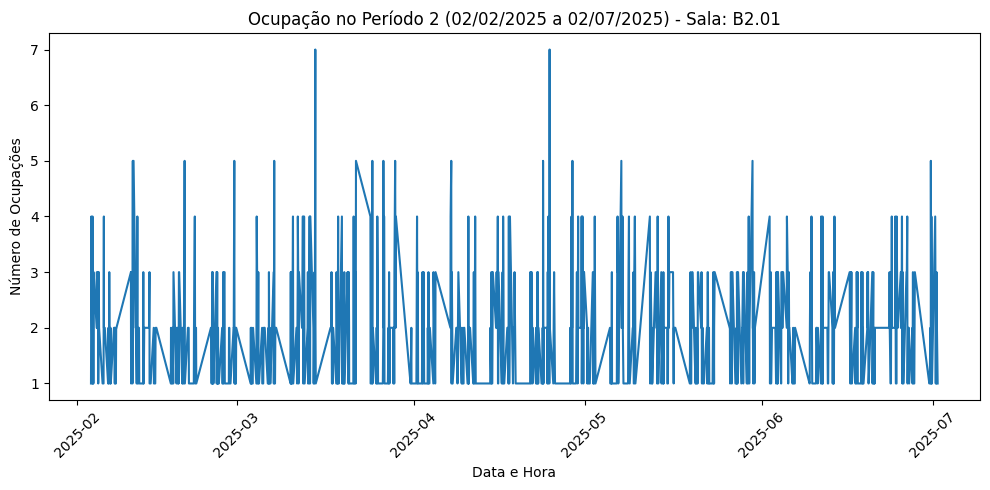

In [6]:

# Caminho para o arquivo CSV
caminho_csv_validas =  r"C:\Users\vitor\OneDrive\Desktop\ADS\testes\entradas_validas_Exemplo.csv"

def gerar_heatmap_ocupacao_por_dia(caminho_csv):
    """
    Lê o arquivo CSV, separa 'Data e Hora', calcula a frequência de ocupação das salas por dia da semana
    e gera um heatmap.
    """
    # Lê o CSV em um DataFrame
    try:
        df = pd.read_csv(caminho_csv)
    except Exception as e:
        print(f"Erro ao ler o arquivo CSV: {e}")
        return
    
    # Verifica se a coluna 'Sala' e 'Data e Hora' existem
    if 'Sala' not in df.columns or 'Data e Hora' not in df.columns:
        print("O arquivo CSV precisa conter as colunas 'Sala' e 'Data e Hora'.")
        return
    
    # Separa 'Data e Hora' em duas colunas: 'Data' e 'Hora'
    try:
        df[['Data', 'Hora']] = df['Data e Hora'].str.split(' ', expand=True)
    except Exception as e:
        print(f"Erro ao separar a coluna 'Data e Hora': {e}")
        return
    
    # Converte a coluna 'Data' para o formato datetime
    try:
        df['Data'] = pd.to_datetime(df['Data'], format='%d/%m/%Y')
    except Exception as e:
        print(f"Erro ao converter a coluna 'Data': {e}")
        return
    
    # Cria uma nova coluna 'Dia da Semana' (0 = Segunda-feira, ..., 6 = Domingo)
    df['Dia da Semana'] = df['Data'].dt.dayofweek
    
    # Mapeia os números para os nomes dos dias da semana
    dias_semana = {
        0: 'Segunda-feira',
        1: 'Terça-feira',
        2: 'Quarta-feira',
        3: 'Quinta-feira',
        4: 'Sexta-feira',
        5: 'Sábado',
        6: 'Domingo'
    }
    df['Dia da Semana'] = df['Dia da Semana'].map(dias_semana)
    
    # Agrupa os dados para contar a frequência de ocupação por Sala e Dia da Semana
    ocupacao = df.groupby(['Dia da Semana', 'Sala']).size().reset_index(name='Frequência')
    
    # Reorganiza os dados em formato de tabela (pivot)
    tabela_ocupacao = ocupacao.pivot(index='Dia da Semana', columns='Sala', values='Frequência').fillna(0)
    
    # Ordena os dias da semana no índice
    ordem_dias = ['Segunda-feira', 'Terça-feira', 'Quarta-feira', 'Quinta-feira', 'Sexta-feira', 'Sábado', 'Domingo']
    tabela_ocupacao = tabela_ocupacao.reindex(ordem_dias)
    
    # Configura o heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(
        tabela_ocupacao,
        cmap="RdYlGn_r",  # Paleta invertida: verde para valores baixos, vermelho para altos
        annot=True,
        fmt=".0f",
        linewidths=0.5,
        cbar_kws={'label': 'Frequência'}
    )
    
    # Ajustes no gráfico
    plt.title("Heatmap de Ocupação das Salas por Dia da Semana")
    plt.xlabel("Salas")
    plt.ylabel("Dias da Semana")
    plt.xticks(rotation=45, ha='right')  # Rotaciona os nomes das salas
    plt.tight_layout()
    
    # Exibe o heatmap
    plt.show()

def plot_ocupacao_linha_periodos_por_sala(df):
    """
    Plota dois gráficos de linha separados para cada sala em períodos diferentes.

    :param df: DataFrame contendo os dados com colunas 'Sala' e 'Data e Hora'.
    """
    # Converte a coluna 'Data e Hora' para datetime, caso não esteja
    df['Data e Hora'] = pd.to_datetime(df['Data e Hora'], format='%d/%m/%Y %H:%M:%S')

    # Definindo os períodos
    data_inicio = datetime(2024, 7, 2)
    ferias_inicio = datetime(2024, 12, 15)
    ferias_fim = datetime(2025, 2, 2)
    data_fim = datetime(2025, 7, 2)

    # Filtra os dados para os dois períodos
    df_periodo1 = df[(df['Data e Hora'] >= data_inicio) & (df['Data e Hora'] <= ferias_inicio)]
    df_periodo2 = df[(df['Data e Hora'] >= ferias_fim) & (df['Data e Hora'] <= data_fim)]

    # Lista de salas únicas
    salas = df['Sala'].unique()

    # Função auxiliar para plotar gráficos
    def plot_periodo_por_sala(df_periodo, sala, titulo):
        ocupacao_sala = df_periodo[df_periodo['Sala'] == sala]
        ocupacao_sala = ocupacao_sala.groupby('Data e Hora').size().reset_index(name='Ocupacao')

        plt.figure(figsize=(10, 5))
        plt.plot(ocupacao_sala['Data e Hora'], ocupacao_sala['Ocupacao'], linestyle='-')
        plt.title(f"{titulo} - Sala: {sala}")
        plt.xlabel('Data e Hora')
        plt.ylabel('Número de Ocupações')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    # Plotando os gráficos para cada sala nos dois períodos
    for sala in salas:
        plot_periodo_por_sala(df_periodo1, sala, 'Ocupação no Período 1 (02/07/2024 a 15/12/2024)')
        plot_periodo_por_sala(df_periodo2, sala, 'Ocupação no Período 2 (02/02/2025 a 02/07/2025)')

# Lê o arquivo CSV e cria o DataFrame
df_validas = pd.read_csv(caminho_csv_validas)

# Chama a função de heatmap
gerar_heatmap_ocupacao_por_dia(caminho_csv_validas)

# Chama a função para o gráfico de linha em períodos
plot_ocupacao_linha_periodos_por_sala(df_validas)
